In [1]:
!pip install ultralytics

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.1/1.1 MB 17.5 MB/s eta 0:00:00


In [1]:
from ID_card_line_extraction_system import *


image 1/1 /content/IMG_20250927_171721_940.jpg: 480x640 1 egyptian_id, 156.9ms
Speed: 3.8ms preprocess, 156.9ms inference, 1.4ms postprocess per image at shape (1, 3, 480, 640)


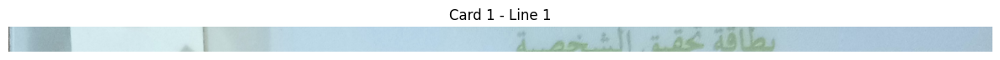

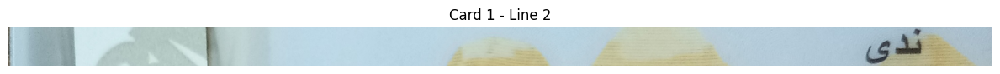

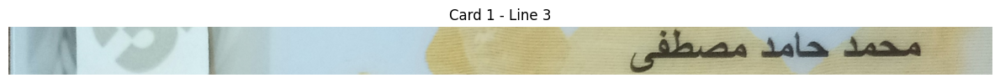

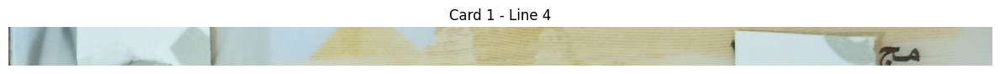

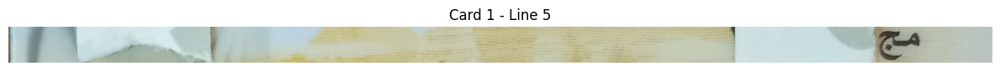

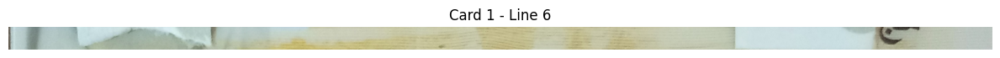

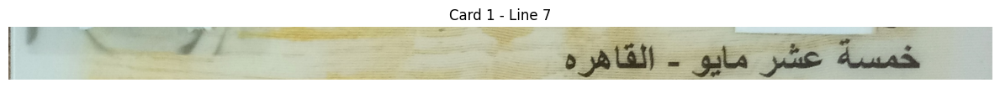

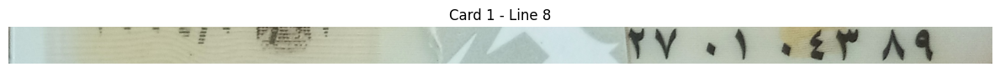

In [ ]:
import logging

logger = logging.getLogger(__name__)

# Configuration
MODEL_PATH = 'best_yolov11_id_model.pt'
TEMPLATE_PATH = 'header_template.png'
TEST_IMAGE_PATH = 'test_data/IMG_20250927_171721_940.jpg'
# Verify required files exist
required_files = [MODEL_PATH, TEMPLATE_PATH, TEST_IMAGE_PATH]
missing_files = [f for f in required_files if not Path(f).exists()]

if missing_files:
    logger.error(f"Missing required files: {missing_files}")

try:
    # Create custom configuration if needed
    config = ProcessingConfig(
        detection_confidence=0.25,
        crop_margin=0,
        min_line_height=50,
        max_line_height=140
    )

    # Initialize pipeline
    logger.info("Initializing ID line extraction pipeline...")
    pipeline = IDLineExtractionPipeline(MODEL_PATH, TEMPLATE_PATH, config)

    # Process image
    logger.info(f"Processing image: {TEST_IMAGE_PATH}")
    results = pipeline.process_image(TEST_IMAGE_PATH)

    if results:
        logger.info("Processing completed successfully!")

        # Display results
        pipeline.visualize_results(results)

        # Print summary
        total_lines = sum(len(lines) for _, lines in results)
        logger.info(f"Summary: Extracted {total_lines} text lines from {len(results)} ID card(s)")
    else:
        logger.warning("No results obtained from processing")

except Exception as e:
    logger.error(f"Pipeline execution failed: {e}")




image 1/1 /content/IMG_20250927_171740_475.jpg: 480x640 1 egyptian_id, 149.7ms
Speed: 3.9ms preprocess, 149.7ms inference, 1.1ms postprocess per image at shape (1, 3, 480, 640)

image 1/1 /content/IMG_20250927_171740_475.jpg: 480x640 1 egyptian_id, 165.6ms
Speed: 3.9ms preprocess, 165.6ms inference, 1.9ms postprocess per image at shape (1, 3, 480, 640)


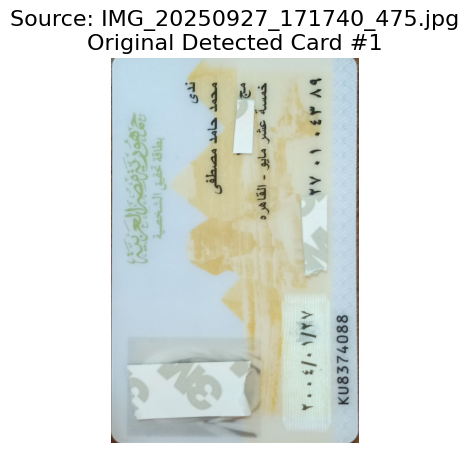

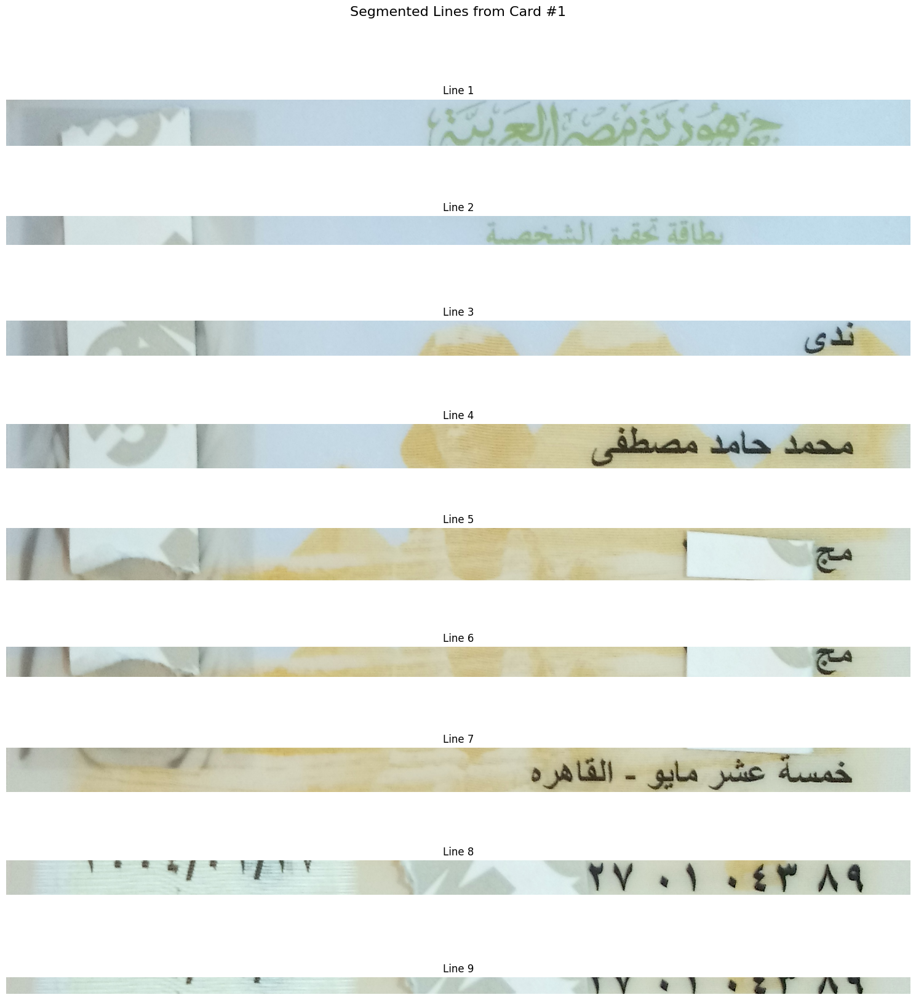


image 1/1 /content/IMG_20250927_171755_364.jpg: 480x640 1 egyptian_id, 174.0ms
Speed: 8.3ms preprocess, 174.0ms inference, 1.4ms postprocess per image at shape (1, 3, 480, 640)

image 1/1 /content/IMG_20250927_171755_364.jpg: 480x640 1 egyptian_id, 149.9ms
Speed: 3.9ms preprocess, 149.9ms inference, 1.8ms postprocess per image at shape (1, 3, 480, 640)


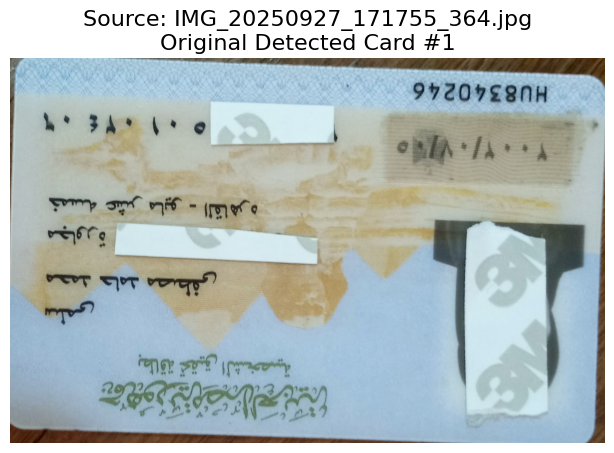

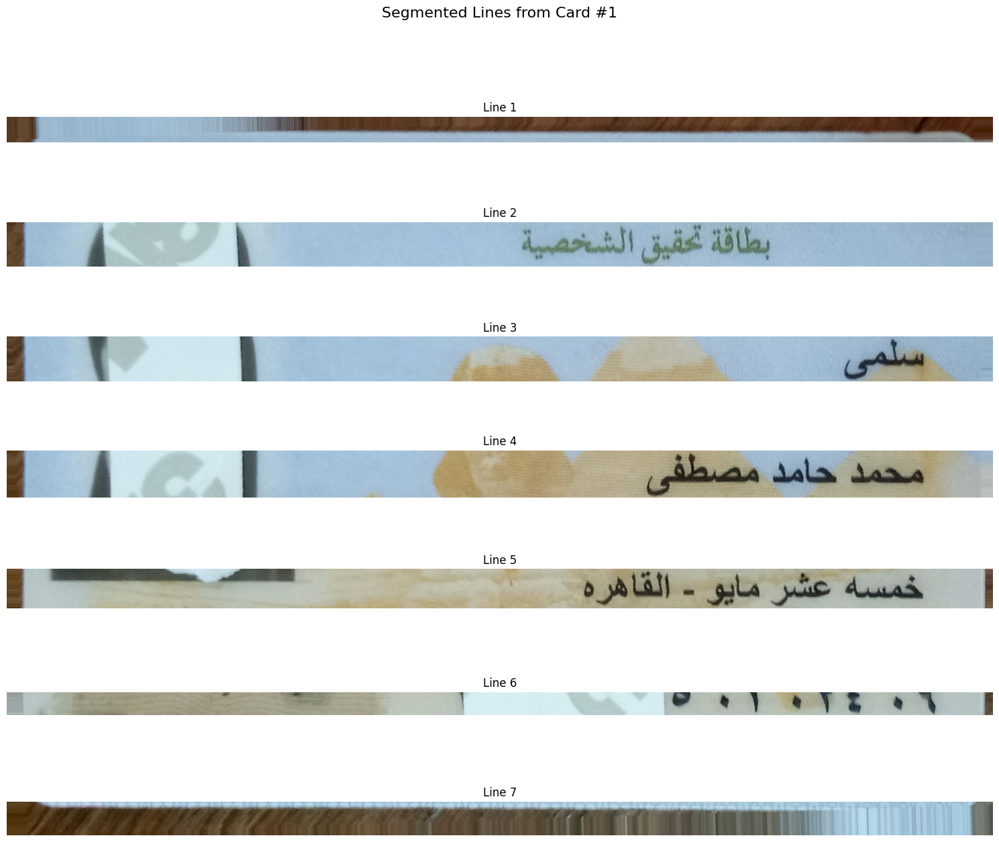


image 1/1 /content/IMG_20250927_171721_940.jpg: 480x640 1 egyptian_id, 145.7ms
Speed: 3.9ms preprocess, 145.7ms inference, 1.3ms postprocess per image at shape (1, 3, 480, 640)

image 1/1 /content/IMG_20250927_171721_940.jpg: 480x640 1 egyptian_id, 146.0ms
Speed: 3.8ms preprocess, 146.0ms inference, 1.4ms postprocess per image at shape (1, 3, 480, 640)


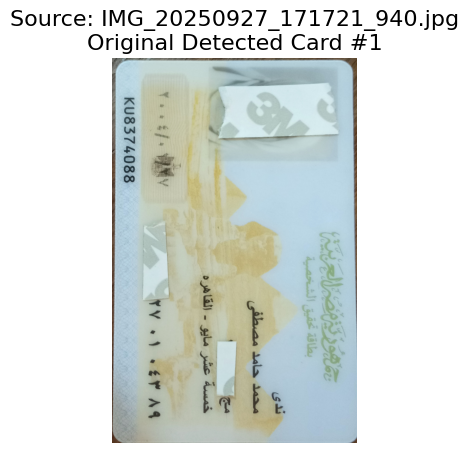

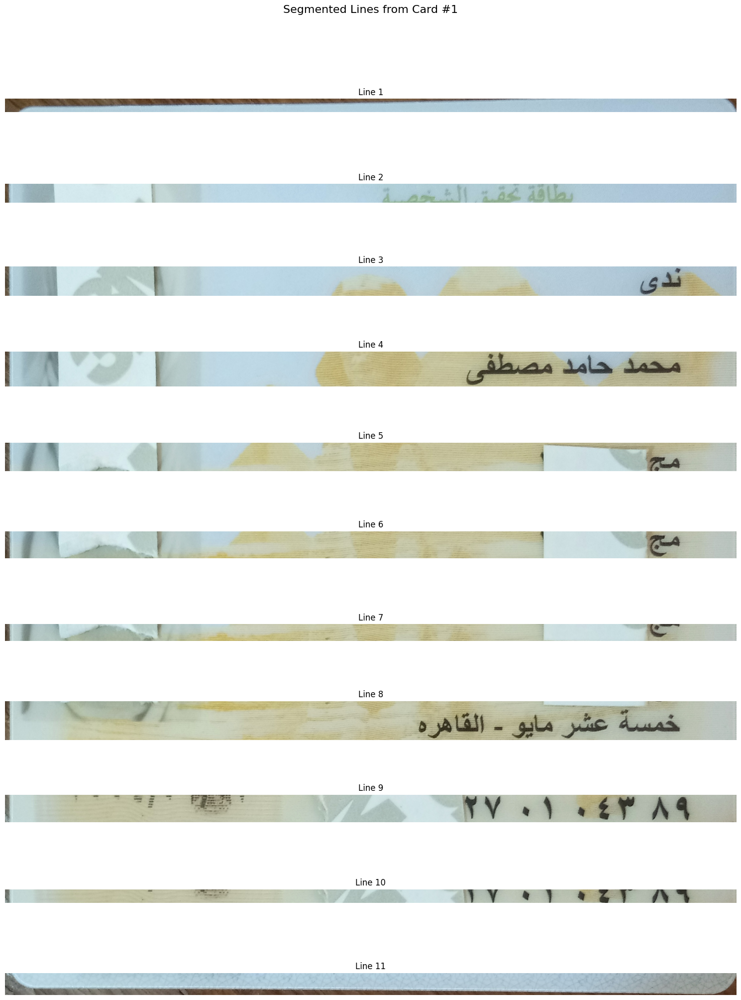


image 1/1 /content/IMG_20250927_171811_805.jpg: 480x640 2 egyptian_ids, 143.9ms
Speed: 3.9ms preprocess, 143.9ms inference, 1.4ms postprocess per image at shape (1, 3, 480, 640)

image 1/1 /content/IMG_20250927_171811_805.jpg: 480x640 2 egyptian_ids, 155.0ms
Speed: 5.7ms preprocess, 155.0ms inference, 1.8ms postprocess per image at shape (1, 3, 480, 640)


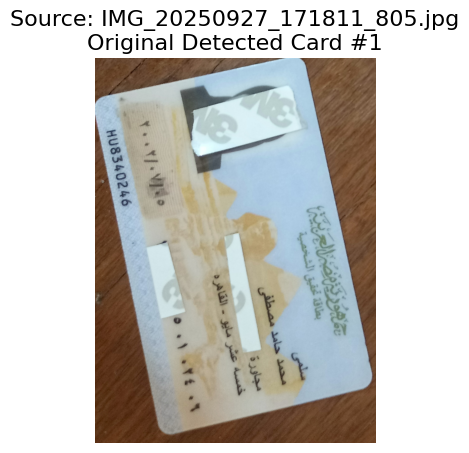

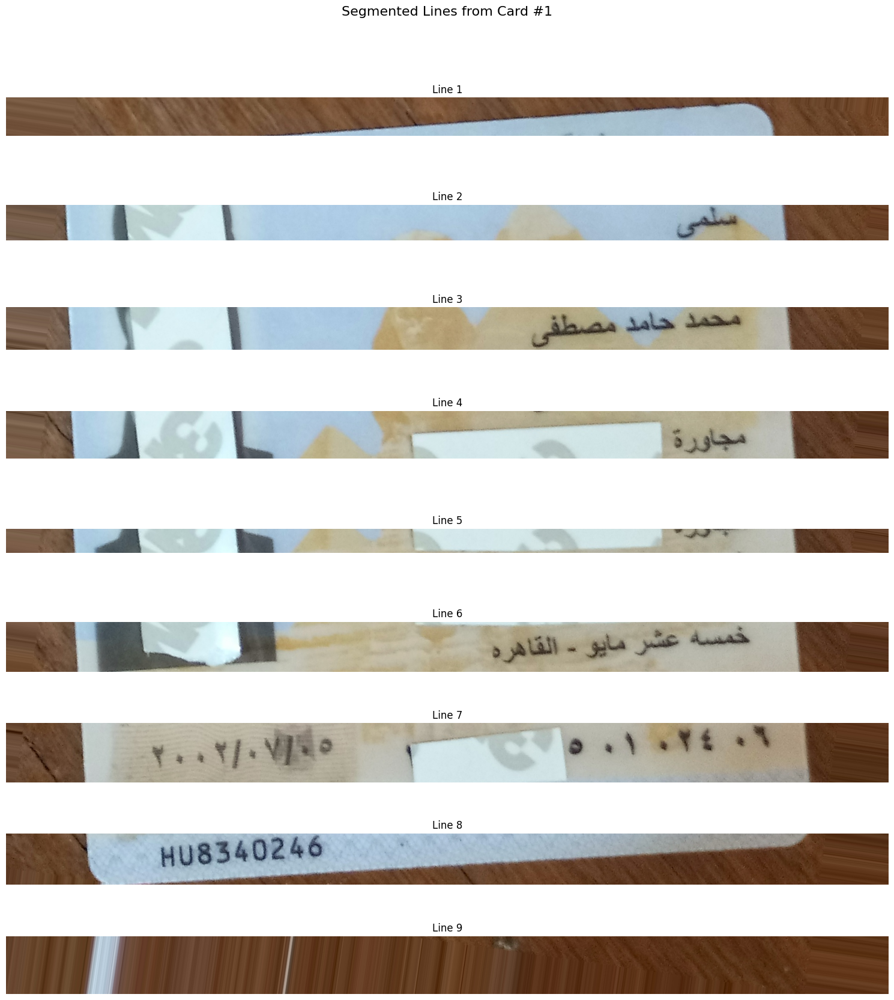

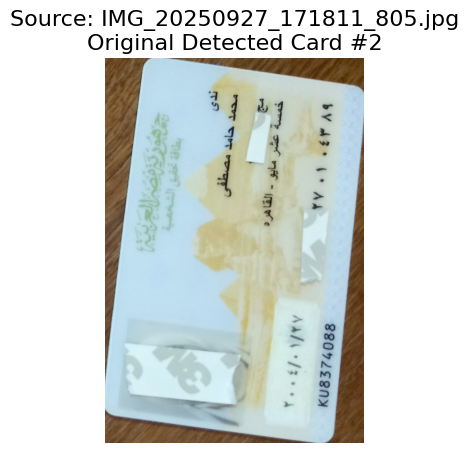

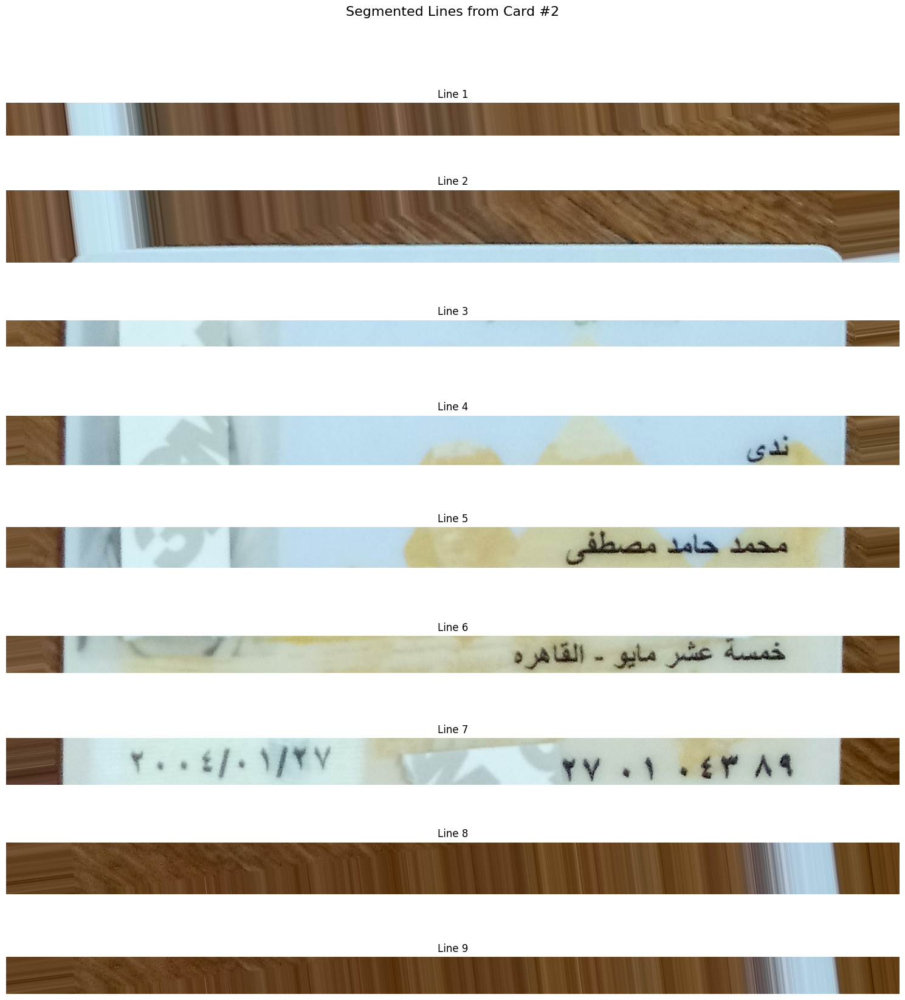


image 1/1 /content/IMG_20250927_171730_827.jpg: 480x640 1 egyptian_id, 161.3ms
Speed: 5.9ms preprocess, 161.3ms inference, 1.9ms postprocess per image at shape (1, 3, 480, 640)

image 1/1 /content/IMG_20250927_171730_827.jpg: 480x640 1 egyptian_id, 225.0ms
Speed: 5.4ms preprocess, 225.0ms inference, 1.3ms postprocess per image at shape (1, 3, 480, 640)


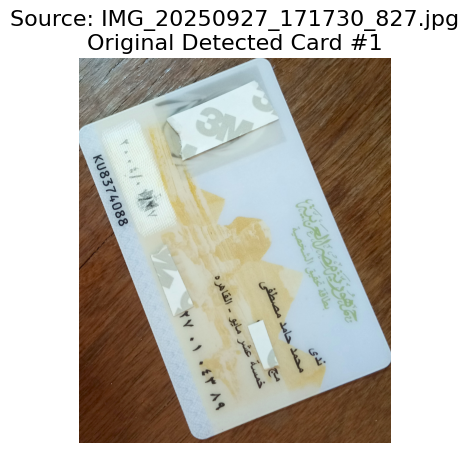

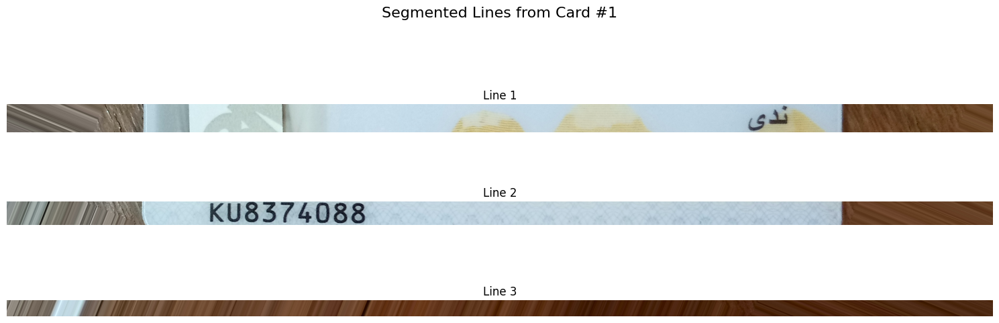


image 1/1 /content/IMG_20250927_171736_086.jpg: 480x640 1 egyptian_id, 234.8ms
Speed: 5.6ms preprocess, 234.8ms inference, 1.9ms postprocess per image at shape (1, 3, 480, 640)

image 1/1 /content/IMG_20250927_171736_086.jpg: 480x640 1 egyptian_id, 247.0ms
Speed: 5.2ms preprocess, 247.0ms inference, 2.0ms postprocess per image at shape (1, 3, 480, 640)


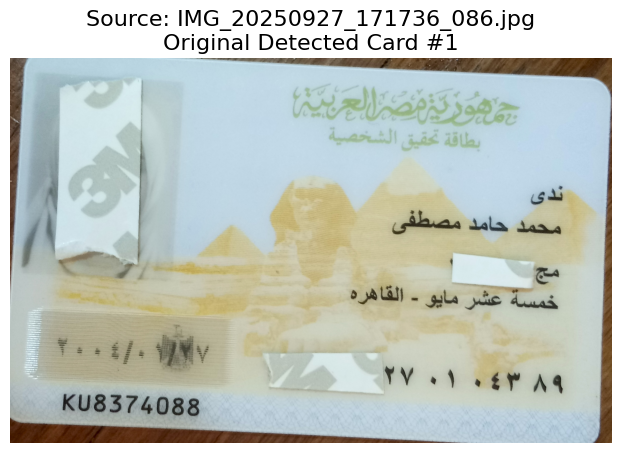

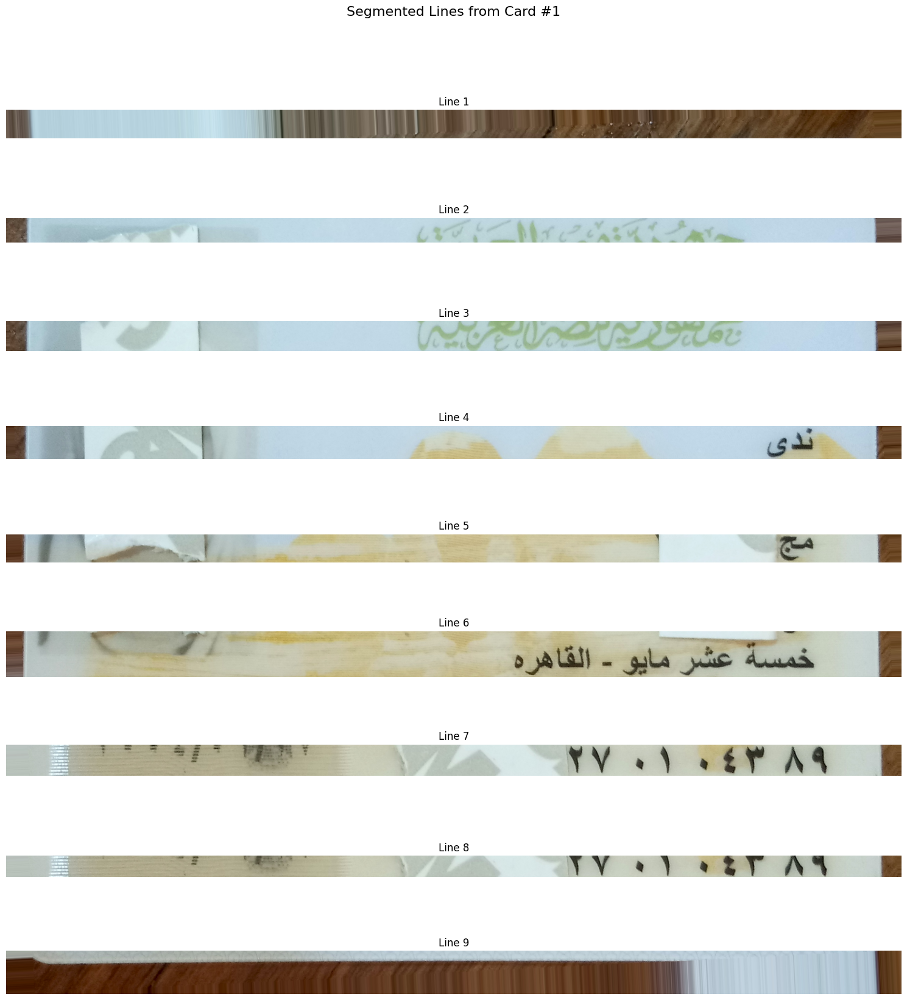


image 1/1 /content/IMG_20250927_171748_620.jpg: 480x640 1 egyptian_id, 171.2ms
Speed: 6.0ms preprocess, 171.2ms inference, 2.6ms postprocess per image at shape (1, 3, 480, 640)

image 1/1 /content/IMG_20250927_171748_620.jpg: 480x640 1 egyptian_id, 229.5ms
Speed: 5.3ms preprocess, 229.5ms inference, 1.6ms postprocess per image at shape (1, 3, 480, 640)


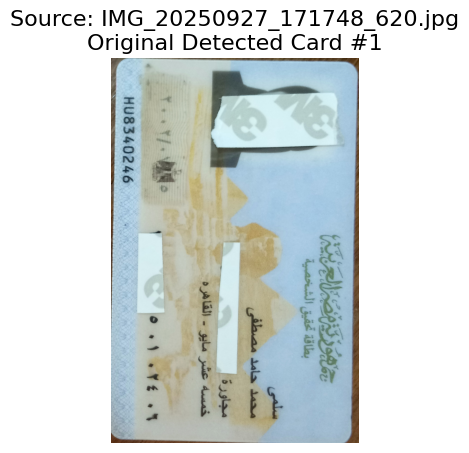

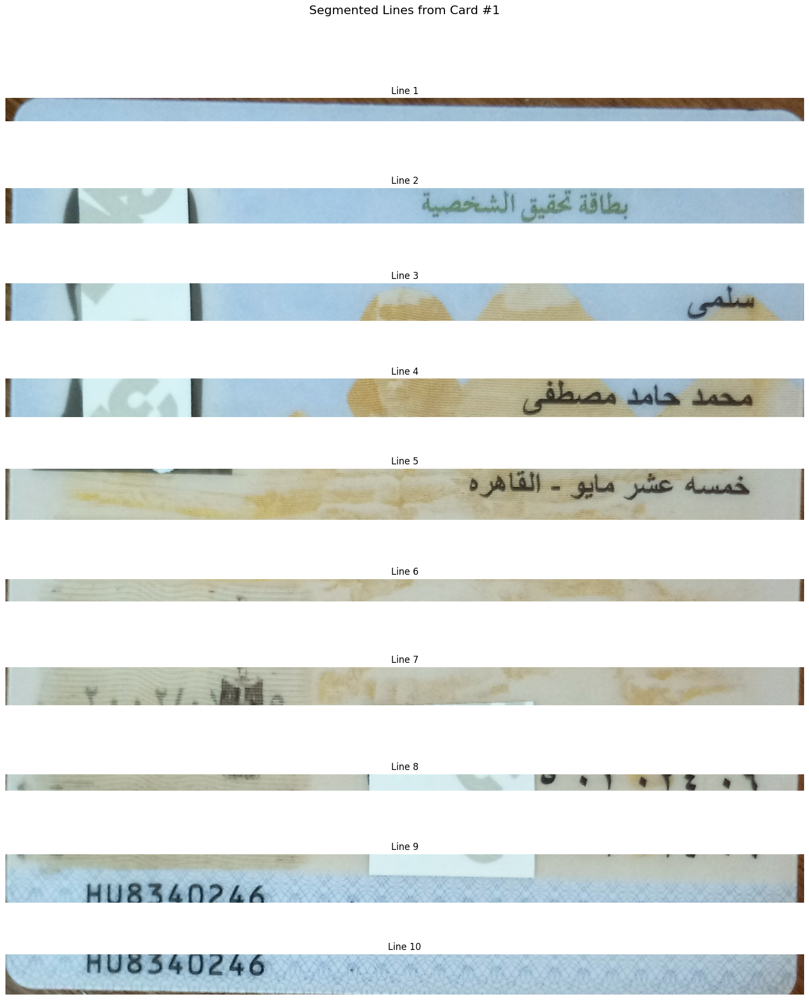


image 1/1 /content/IMG_20250927_171804_770.jpg: 480x640 2 egyptian_ids, 214.3ms
Speed: 5.4ms preprocess, 214.3ms inference, 1.5ms postprocess per image at shape (1, 3, 480, 640)

image 1/1 /content/IMG_20250927_171804_770.jpg: 480x640 2 egyptian_ids, 222.9ms
Speed: 5.8ms preprocess, 222.9ms inference, 2.1ms postprocess per image at shape (1, 3, 480, 640)


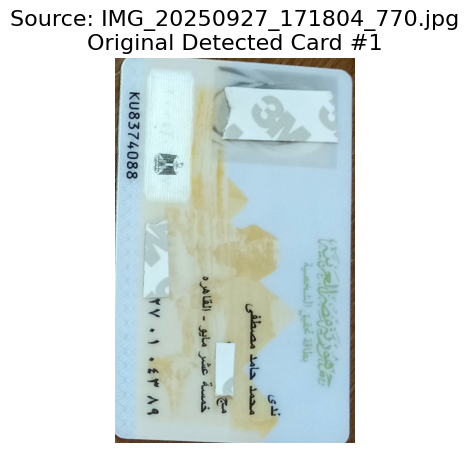

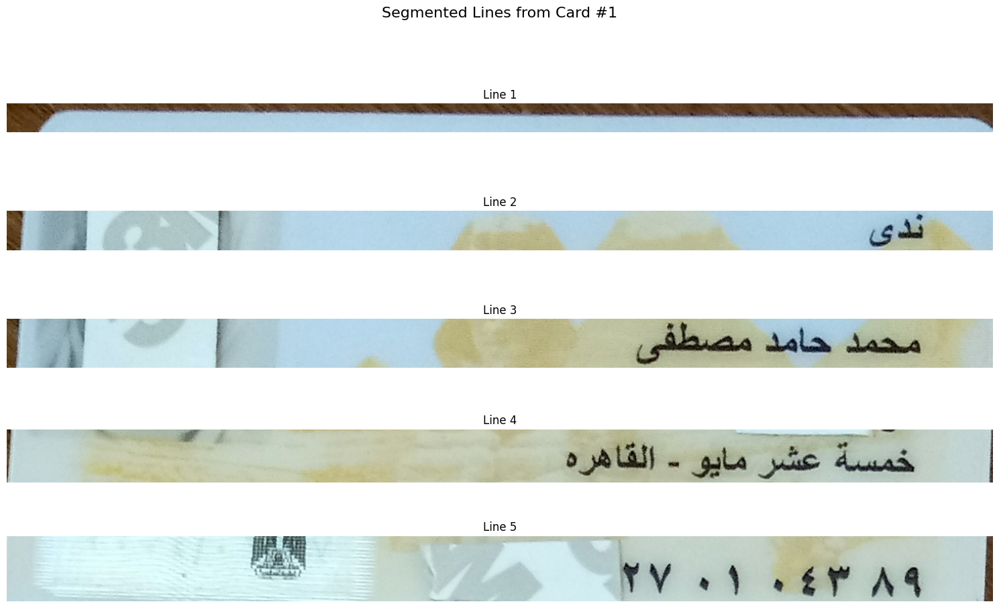

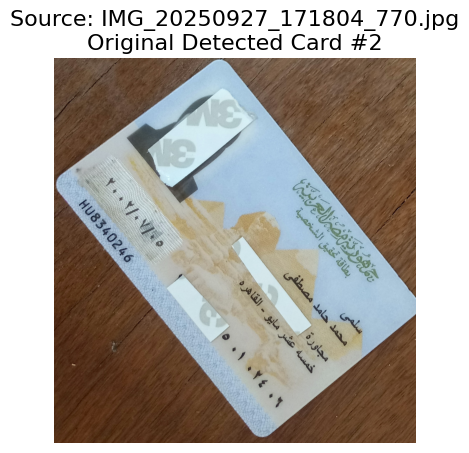

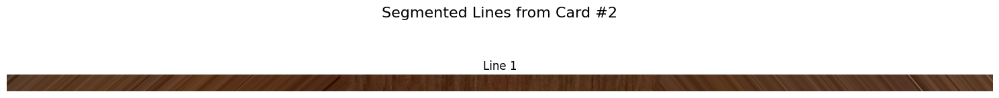

In [ ]:
import logging
from pathlib import Path
import cv2
import matplotlib.pyplot as plt


def visualize_process_for_image(pipeline: IDLineExtractionPipeline, image_path: Path):
    """
    Processes a single image and displays the original card and its segmented lines.

    Args:
        pipeline: The initialized IDLineExtractionPipeline instance.
        image_path: The Path object for the image to process.
    """
    logger.info(f"--- Processing image: {image_path.name} ---")

    original_image = cv2.imread(str(image_path))
    if original_image is None:
        logger.error(f"Could not read image: {image_path.name}")
        return
    original_image_rgb = cv2.cvtColor(original_image, cv2.COLOR_BGR2RGB)

    bounding_boxes = pipeline.detector.detect_cards(
        str(image_path), pipeline.config.detection_confidence
    )

    if not bounding_boxes:
        logger.warning(f"No ID cards detected in {image_path.name}")
        return

    results = pipeline.process_image(str(image_path))
    if not results:
        logger.warning(f"Line segmentation failed for {image_path.name}")
        return

    for card_idx, (result_card_idx, final_lines) in enumerate(results):
        bbox = bounding_boxes[card_idx]
        x_min = max(0, bbox.x_min - pipeline.config.crop_margin)
        y_min = max(0, bbox.y_min - pipeline.config.crop_margin)
        x_max = min(original_image_rgb.shape[1], bbox.x_max + pipeline.config.crop_margin)
        y_max = min(original_image_rgb.shape[0], bbox.y_max + pipeline.config.crop_margin)

        original_card_crop = original_image_rgb[y_min:y_max, x_min:x_max]

        # --- Display the original detected card ---
        plt.figure(figsize=(15, 5))
        plt.imshow(original_card_crop)
        plt.title(f"Source: {image_path.name}\nOriginal Detected Card #{card_idx + 1}", fontsize=16)
        plt.axis('off')
        plt.show()

        # --- Display the segmented lines ---
        if not final_lines:
            logger.warning(f"No lines segmented for card {card_idx + 1}")
            continue

        num_lines = len(final_lines)
        plt.figure(figsize=(15, num_lines * 2))
        plt.suptitle(f"Segmented Lines from Card #{card_idx + 1}", fontsize=16, y=0.95)

        for line_idx, line_img in enumerate(final_lines):
            ax = plt.subplot(num_lines, 1, line_idx + 1)
            ax.imshow(line_img)
            ax.set_title(f"Line {line_idx + 1}")
            ax.axis('off')

        plt.tight_layout(rect=[0, 0, 1, 0.93])
        plt.show()


def main():
    """
    Main execution function to run the pipeline on all images in a directory.
    """
    logger = logging.getLogger(__name__)

    # --- Configuration ---
    MODEL_PATH = 'best_yolov11_id_model.pt'
    TEMPLATE_PATH = 'header_template.png'
    TEST_DATA_DIR = 'test_data'

    # --- Verification ---
    required_files = [MODEL_PATH, TEMPLATE_PATH]
    missing_files = [f for f in required_files if not Path(f).exists()]
    if missing_files:
        logger.error(f"Missing required files: {missing_files}")
        return
    if not Path(TEST_DATA_DIR).is_dir():
        logger.error(f"Test data directory not found: {TEST_DATA_DIR}")
        return

    try:
        # --- Initialization ---
        config = ProcessingConfig(
            detection_confidence=0.25,
            crop_margin=10, # A small margin
            min_line_height=40, # adjust according to ur data
            max_line_height=140 # adjust according to ur data
        )

        logger.info("Initializing ID line extraction pipeline...")
        pipeline = IDLineExtractionPipeline(MODEL_PATH, TEMPLATE_PATH, config)

        # --- Processing Loop ---
        image_extensions = ['*.jpg']
        image_paths = []
        for ext in image_extensions:
            image_paths.extend(Path(TEST_DATA_DIR).glob(ext))

        if not image_paths:
            logger.error(f"No images found in {TEST_DATA_DIR}")
            return

        logger.info(f"Found {len(image_paths)} images to process...")
        for image_path in image_paths:
            visualize_process_for_image(pipeline, image_path)

    except Exception as e:
        logger.error(f"A critical error occurred during the main execution: {e}", exc_info=True)


if __name__ == '__main__':
    main()